# building an image classifier
> fast SOTA classifier using transfer learning.

- toc: true
- badges: true
- comments: true

In [ ]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 95.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.6/485.6 kB 45.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 70.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 24.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 17.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 69.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 29.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 102.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 76.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
#hide
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
#seting search vars
tank_types = 'merkava mk4','M1 Abrams','water'
path = Path('tanks')

#downloading 150 images to labeled directories
if not path.exists():
    path.mkdir()
    for o in tank_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        urls = search_images_ddg(f'{o} tank', max_images=150)
        download_images(dest, urls=urls)

#deleting error files
fns = get_image_files(path)
failed = verify_images(fns)
failed.map(Path.unlink);

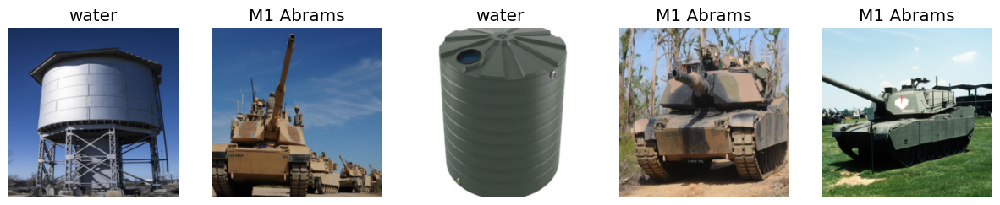

In [ ]:
#Preparing the data for the model
tanks = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())

dls = tanks.dataloaders(path)

dls.valid.show_batch(max_n=5, nrows=1)

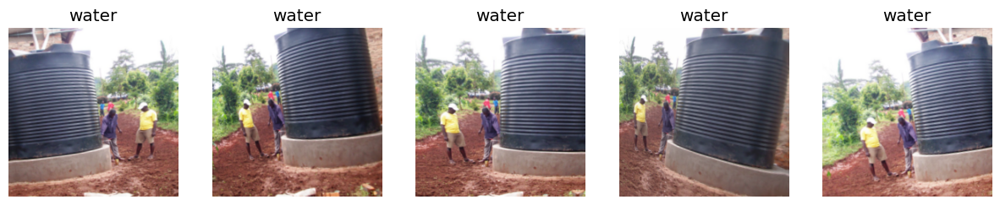

In [ ]:
#augmentation sample
dls.train.show_batch(max_n=5, nrows=1, unique=True)

In [ ]:
#building basic cnn learner using pretrain resnet and fine tune it:
learnMC = cnn_learner(dls, resnet18, metrics=error_rate)
learnMC.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.436226,0.635670,0.253012,00:24


epoch,train_loss,valid_loss,error_rate,time
0,0.576077,0.466921,0.192771,00:21
1,0.419052,0.226409,0.096386,00:22
2,0.320220,0.150371,0.036145,00:23
3,0.256160,0.137806,0.036145,00:26


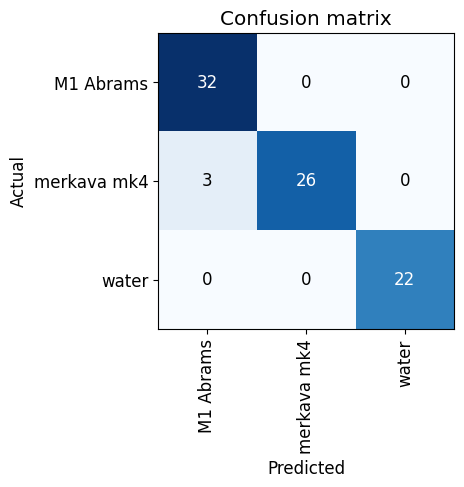

In [ ]:
#check model confusion matrix
interp = ClassificationInterpretation.from_learner(learnMC)
interp.plot_confusion_matrix()

Looks like the model has about 3-4% error rate, we can check what were the hardest images for it base on the highest loss:

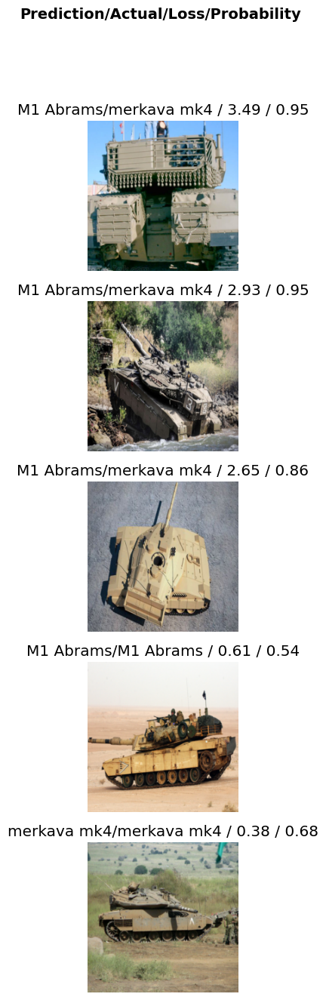

In [ ]:
interp.plot_top_losses(5, nrows=5)

After training the model, fastai has a nifty function that help us cles the data based in the highest loss in each category.
We can just addjust to correct category/delete in each the image checkbox and run the update commands for each group

In [ ]:
cleaner = ImageClassifierCleaner(learnMC)
cleaner

In [ ]:
#deleting/addjusting category from the cleaner for each group
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

When we done cleaning our data we can re-train our model to improve its performance.

Here are a few random samples downloads to check the model inferece before deplpy to production:

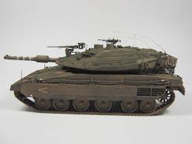

In [ ]:
im = PILImage.create('/content/merkava_mk4.jpg')
im.thumbnail((192,192))
im

In [ ]:
pred,pred_idx,probs = learnMC.predict(im)
f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

'Prediction: merkava mk4; Probability: 0.9997'

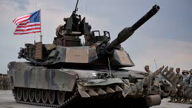

In [ ]:
im = PILImage.create('/content/Abrams_m1.jpg')
im.thumbnail((192,192))
im

In [ ]:
pred,pred_idx,probs = learnMC.predict(im)
f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

'Prediction: M1 Abrams; Probability: 0.9822'

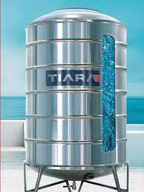

In [ ]:
im = PILImage.create('/content/water_tank.jpg')
im.thumbnail((192,192))
im

In [ ]:
pred,pred_idx,probs = learnMC.predict(im)
f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

'Prediction: water; Probability: 1.0000'

The model classification appears to be fine, so the last step will be to save it for deployment:

In [ ]:
learnMC.export()

In [ ]:
#hide
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [ ]:
#hide
learn_inf = load_learner(path/'export.pkl')

In [ ]:
#hide
learn_inf.dls.vocab

['M1 Abrams', 'merkava mk4', 'water']